In [1]:
import h5py, sys, os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cm as cm

In [2]:
sys.path.append('/mnt/cbis/home/benedikt/.local/dragonfly/utils/py_src')

In [3]:
import writeemc
import detector
import reademc

In [4]:
path_to_data = "../../data/sparse/" # scratch/sparse on Maxwell
path_to_aux = "../../data/aux/" # scratch/benedikt/aux on Maxwell
path_to_geometry = "../../geometry/"
path_to_recons = "../../data/recons/"

## Reading 2D EMC classes (round 2)

In [5]:
emc_folder = path_to_recons + "melv_0001/"
emc_output = emc_folder + "data/r2/output_020.h5"
emc_photons = emc_folder + 'photons.txt'
emc_detector = path_to_recons + "det/det_2145_lowq1.h5"

In [6]:
with h5py.File(emc_output,'r') as f:
    occupancies = f['occupancies'][:]
    likelihood = f['likelihood'][:]
    orientations = f['orientations'][:]
    images = f['intens'][:]
    scale = f['scale'][:]

In [7]:
modes = orientations % occupancies.shape[1]
blacklisted = (occupancies == 0).all(axis=1)
ndata = len(modes) - blacklisted.sum()

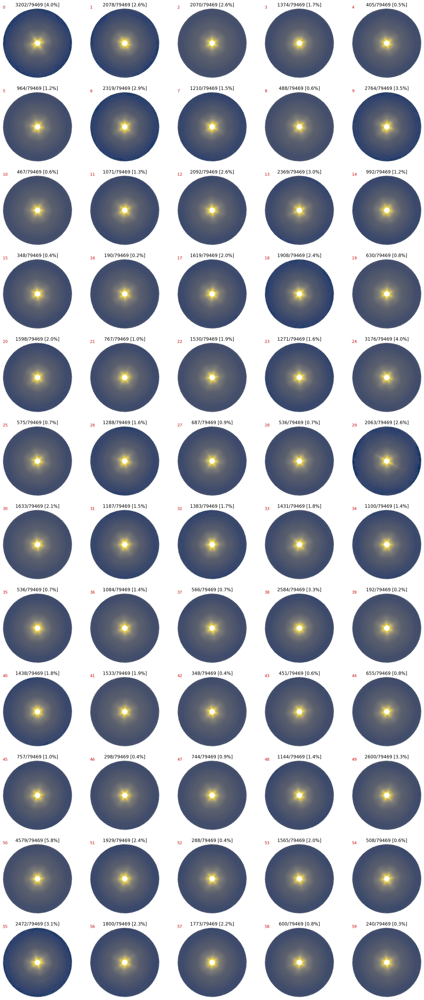

In [8]:
N = occupancies.shape[1]
ncols = 5
nrows = N//ncols
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*4,nrows*4), dpi=200)
for i in range(N):
    c,r = i//ncols, i%ncols
    axes[c,r].axis('off')
    nclass = ((modes==i) & (~blacklisted)).sum()
    axes[c,r].set_title("%d/%d [%.1f%%]" %(nclass,ndata, nclass/ndata*100.))
    axes[c,r].imshow(images[i], norm=colors.LogNorm(vmin=0.0001, vmax=3), cmap='cividis')
    axes[c,r].text(0,0, "%d" %i, color='r')
plt.savefig("../../plots/2dclasses.png", bbox_inches='tight')
plt.show()

## SVD analysis

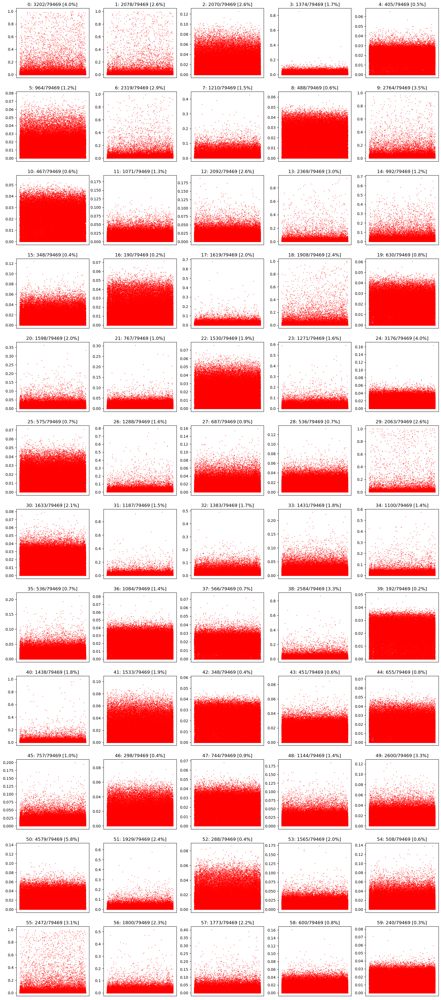

In [12]:
N = occupancies.shape[1]
ncols = 5
nrows = N//ncols
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*4,nrows*4), dpi=100)
for i in range(N):
    c,r = i//ncols, i%ncols
    nclass = ((modes==i) & (~blacklisted)).sum()
    axes[c,r].set_title("%d: %d/%d [%.1f%%]" %(i, nclass,ndata, nclass/ndata*100.))
    axes[c,r].plot(occupancies[:,i], 'r.', ms=1)
    axes[c,r].set_xticks([])
plt.show()

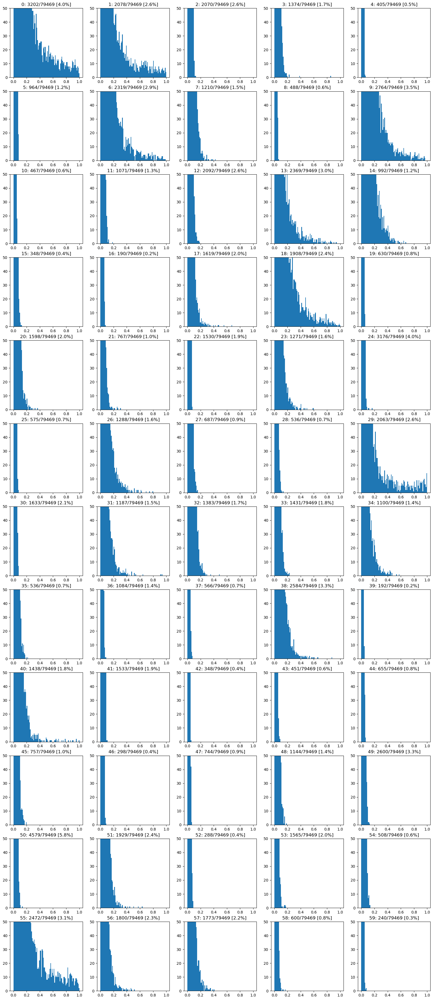

In [13]:
N = occupancies.shape[1]
ncols = 5
nrows = N//ncols
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*4,nrows*4), dpi=100)
for i in range(N):
    c,r = i//ncols, i%ncols
    nclass = ((modes==i) & (~blacklisted)).sum()
    axes[c,r].set_title("%d: %d/%d [%.1f%%]" %(i, nclass,ndata, nclass/ndata*100.))
    axes[c,r].hist(occupancies[:,i].ravel(), range=(0,1), bins=100)
    axes[c,r].set_ylim(0,50)
plt.show()

In [9]:
from scipy.linalg import svd, svdvals

In [10]:
s = svdvals(occupancies[:])

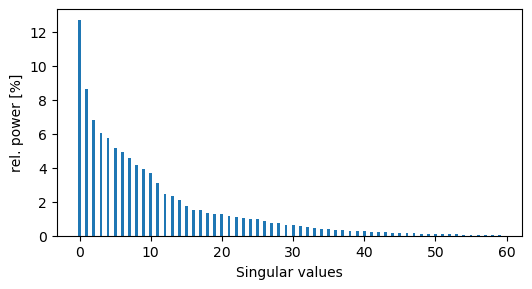

In [11]:
plt.figure(figsize=(6,3), dpi=100)
plt.bar(range(occupancies.shape[1]),s/s.sum()*100, width=0.4)
plt.xlabel("Singular values")
plt.ylabel("rel. power [%]")
plt.show()